In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import glob
import seaborn as sns
import bbknn
from pandas.core.index import RangeIndex
from matplotlib import rcParams
from matplotlib.pyplot import rc_context

/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/ipykernel_launcher.py:8: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  


In [2]:
sc.settings.verbosity = 3   
sc.logging.print_header() 
sc.settings.set_figure_params(dpi=80, facecolor='white') 

scanpy==1.6.0 anndata==0.7.5 umap==0.4.6 numpy==1.19.4 scipy==1.5.3 pandas==1.1.4 scikit-learn==0.23.2 statsmodels==0.12.1 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.2


In [3]:
!pwd

/home/harris/VE2hrAmpIsth


In [4]:
VE2AmIs_subset = sc.read( './VE2AmIs_subset.h5ad') 

# Loading the data file or previously saved file as 'adata'. Does not have to be called adata can be named anything.
VE2AmIs = sc.read( './VE2AmIs.h5ad') 

In [5]:
sc.pp.neighbors(VE2AmIs_subset, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [6]:
sc.tl.umap(VE2AmIs_subset)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


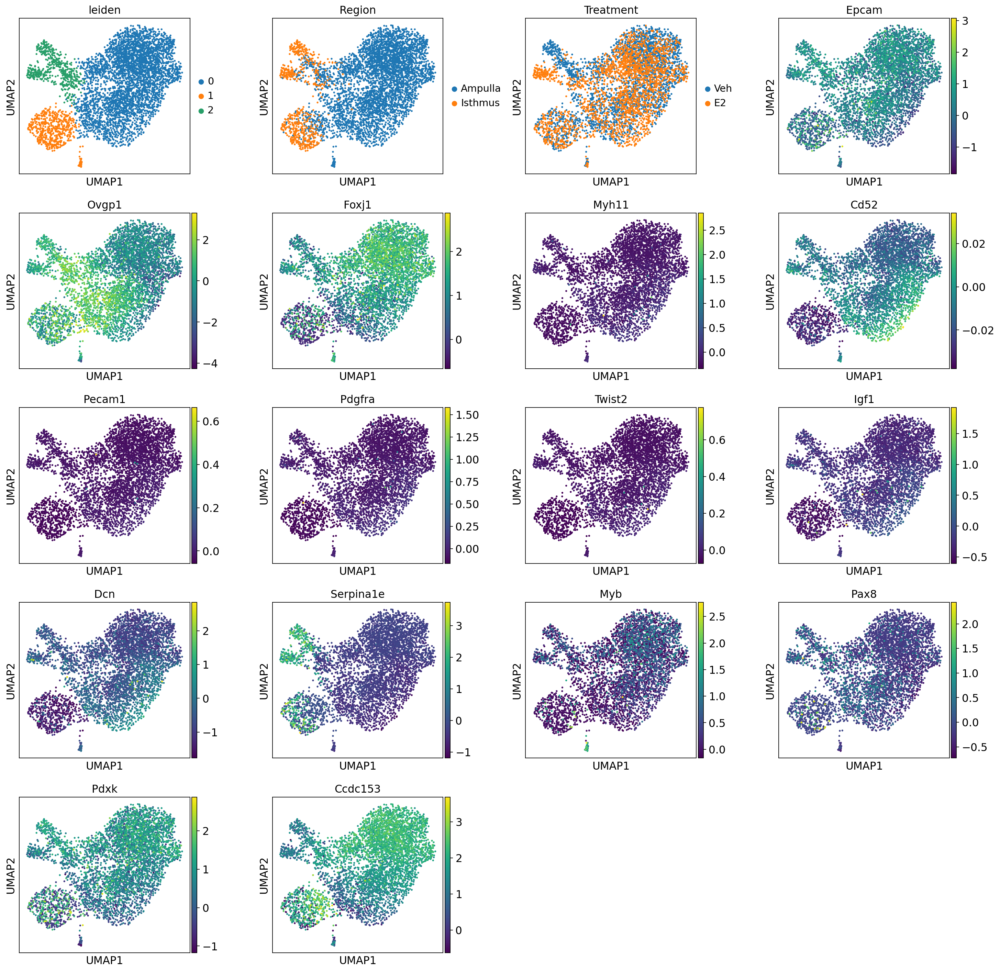

In [7]:
sc.pl.umap(VE2AmIs_subset, wspace=0.35,
           color=['leiden', 'Region', 'Treatment', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 
                  
                  'Pdgfra', 'Twist2', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8','Pdxk', 'Ccdc153'])

In [8]:
sc.tl.leiden(VE2AmIs_subset, resolution=0.1)

running Leiden clustering
    finished: found 3 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


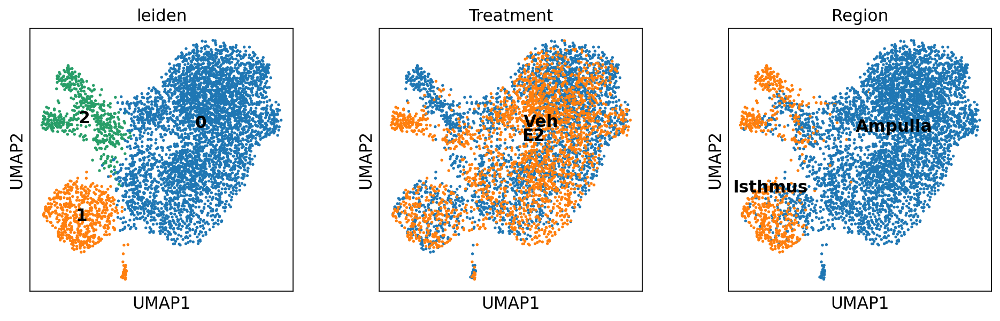

In [9]:
sc.pl.umap(VE2AmIs_subset,color=['leiden','Treatment', 'Region'],legend_loc='on data')

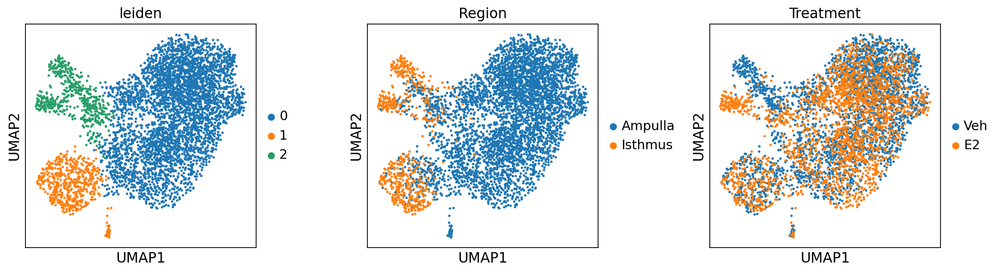

In [10]:
sc.pl.umap(VE2AmIs_subset, wspace=0.35, 
           color=['leiden', 'Region', 'Treatment'])

In [11]:
VE2AmIs_subset.write('./VE2AmIs_subset.h5ad')

In [12]:
VE2AmIs_subset_batchcorrected = bbknn.bbknn(VE2AmIs_subset, batch_key='Region', copy=True)

computing batch balanced neighbors
	finished: added to `.uns['neighbors']`
	`.obsp['distances']`, distances for each pair of neighbors
	`.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


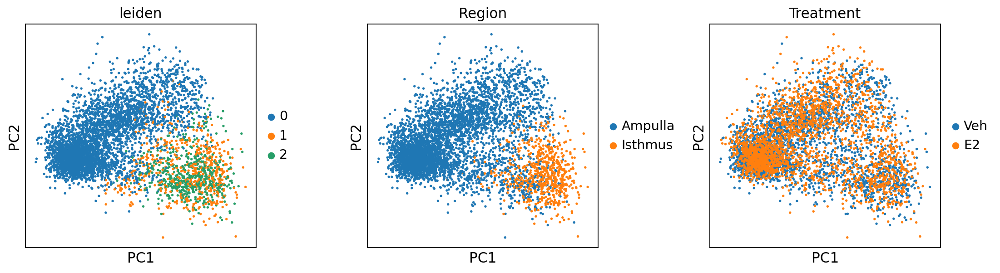

In [13]:
sc.pl.pca(VE2AmIs_subset_batchcorrected, wspace=0.35,
          color=['leiden', 'Region', 'Treatment'])

In [14]:
sc.tl.umap(VE2AmIs_subset_batchcorrected)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:02)


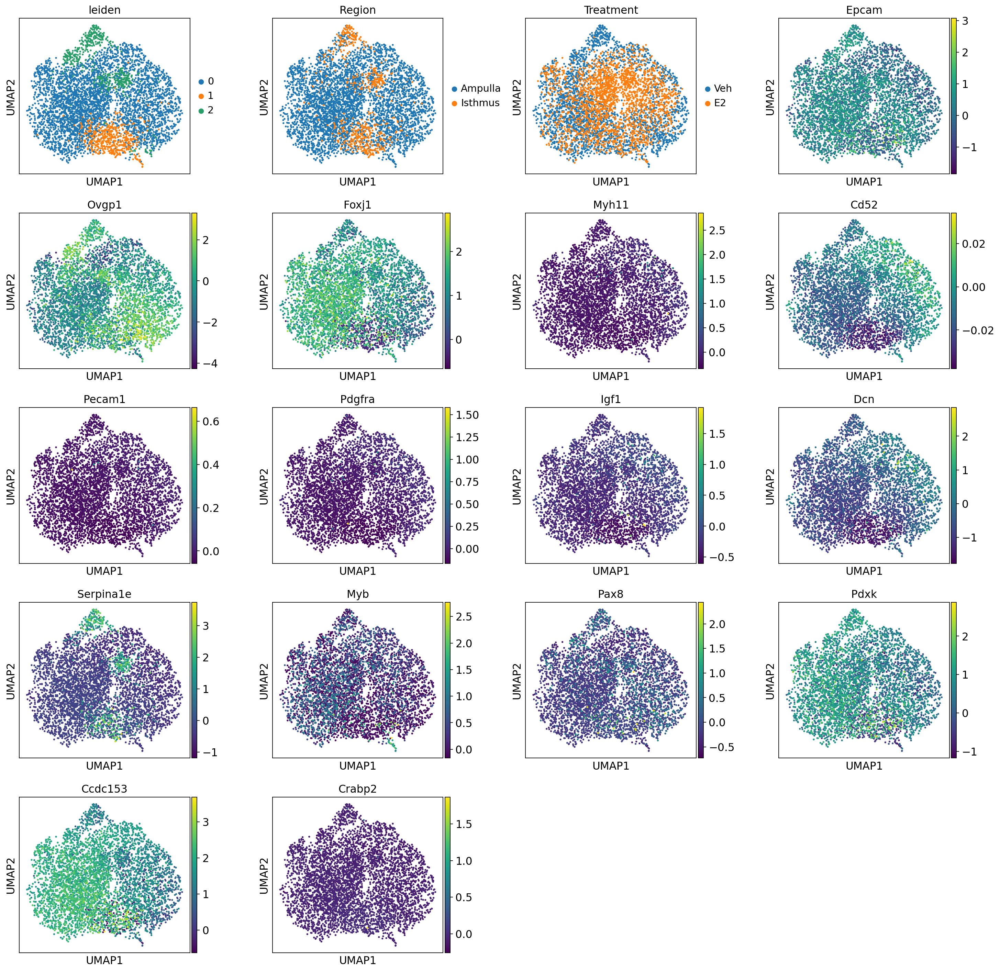

In [15]:
sc.pl.umap(VE2AmIs_subset_batchcorrected, wspace=0.35, 
           color=['leiden', 'Region', 'Treatment', 'Epcam', 'Ovgp1', 'Foxj1', 'Myh11', 'Cd52', 'Pecam1', 
                  
                  'Pdgfra', 'Igf1', 'Dcn', 'Serpina1e', 'Myb', 'Pax8', 'Pdxk', 'Ccdc153', 'Crabp2'])

In [16]:
marker_genes = ['Epcam', 'Krt8','Krt19','Vim','Pdgfra','Twist2', 'Sprr2f',
                'Acta2', 'Myh11','Foxj1', 'Ccdc153', 'Ovgp1','Wt1','Serpina1e',
                'S100g','Pecam1', 'Cd52', 'Pgr', 'Esr1', 'Crabp2'
                 ]

In [17]:
VE2AmIs_subset_batchcorrected.obs.groupby(["leiden","Treatment","Region"]).apply(len)

leiden  Treatment  Region 
0       Veh        Ampulla    2207
                   Isthmus      15
        E2         Ampulla    1768
                   Isthmus       1
1       Veh        Ampulla     143
                   Isthmus     141
        E2         Ampulla      75
                   Isthmus     196
2       Veh        Ampulla     163
                   Isthmus     153
        E2         Ampulla      85
                   Isthmus     143
dtype: int64

In [18]:
new_cluster_names = [
     '0 Ciliated_InfAmp',
     '1 Ciliated_IsthUTJ',
    '2 Ciliated_IsthUTJ_2'
]
VE2AmIs_subset_batchcorrected.rename_categories('leiden', new_cluster_names)

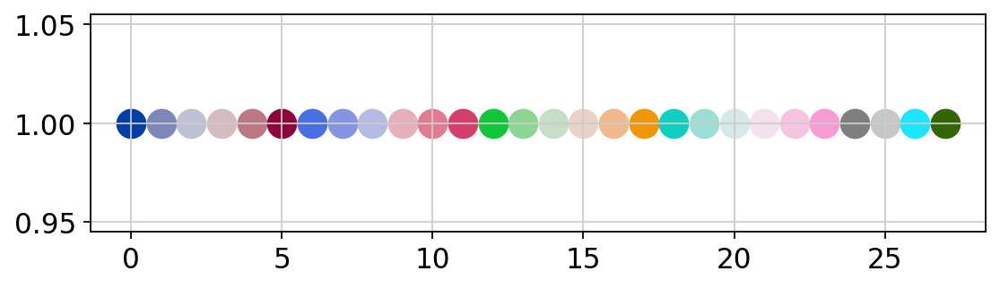

In [19]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [20]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE2AmIs_subset_batchcorrected.uns['leiden_colors'])

In [21]:
new_colors[[0]] = zeileis_colors[[23]]  
new_colors[[1]] = zeileis_colors[[27]]
new_colors[[2]] = zeileis_colors[[18]]  

In [22]:
VE2AmIs_subset_batchcorrected.uns['leiden_colors'] = new_colors

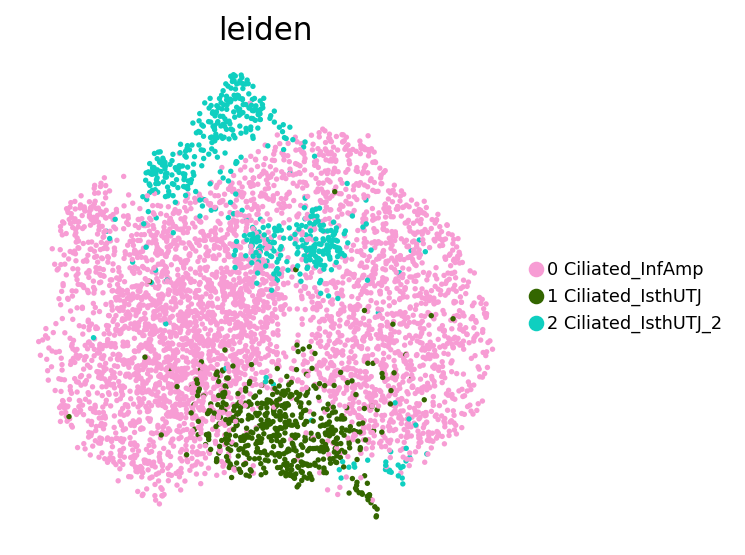

In [23]:
sc.pl.umap(VE2AmIs_subset_batchcorrected, color='leiden', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save='Veh_E2_2h_3 clusters_Ciliated cells only leiden.pdf')

In [24]:
new_cluster_names = [
    '0 Veh',
    '1 E2'
]
VE2AmIs_subset_batchcorrected.rename_categories('Treatment', new_cluster_names)

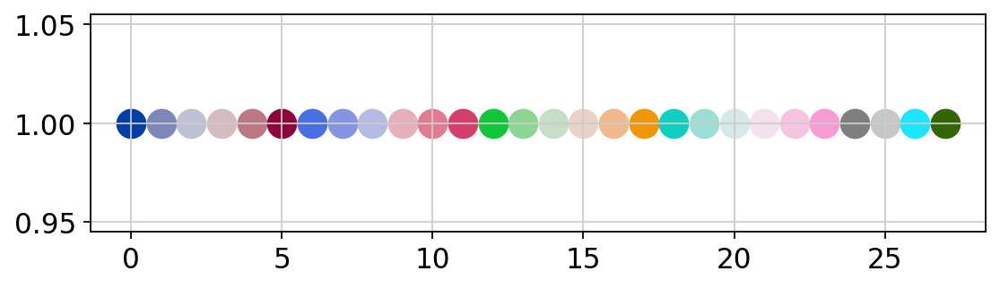

In [25]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [26]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE2AmIs_subset_batchcorrected.uns['Treatment_colors'])

In [27]:
new_colors[[0]] = zeileis_colors[[6]]  #0 Veh
new_colors[[1]] = zeileis_colors[[11]]  #1 E2

In [28]:
VE2AmIs_subset_batchcorrected.uns['Treatment_colors'] = new_colors

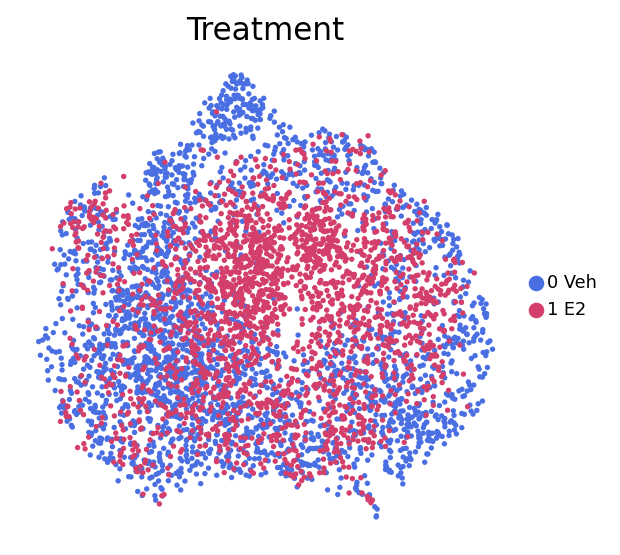

In [29]:
sc.pl.umap(VE2AmIs_subset_batchcorrected, color='Treatment', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save='Veh_E2_2h_3 clusters_Ciliated cells only Treatment.pdf')

In [30]:
new_cluster_names = [
    '0 InfAmp',
    '1 IsthUTJ'
]
VE2AmIs_subset_batchcorrected.rename_categories('Region', new_cluster_names)

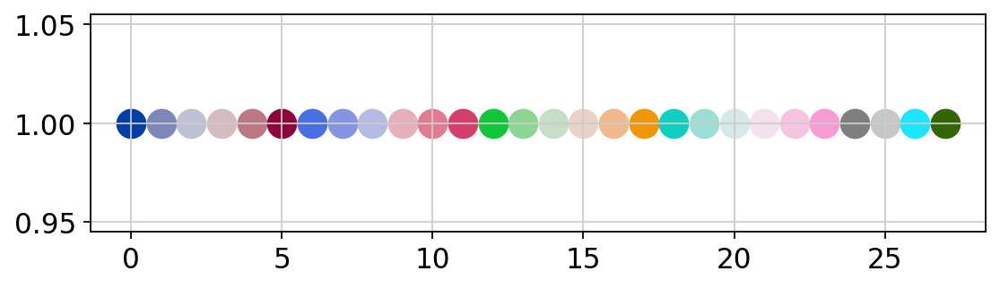

In [31]:
plt.figure(figsize=(8, 2))
for i in range(28):
    plt.scatter(i, 1, c=sc.pl.palettes.zeileis_28[i], s=200)
plt.show()

In [32]:
zeileis_colors = np.array(sc.pl.palettes.zeileis_28)
new_colors = np.array(VE2AmIs_subset_batchcorrected.uns['Region_colors'])

In [33]:
new_colors[[0]] = zeileis_colors[[9]]  #0 InfAmp
new_colors[[1]] = zeileis_colors[0]  #1 IsthUTJ

In [34]:
VE2AmIs_subset_batchcorrected.uns['Region_colors'] = new_colors

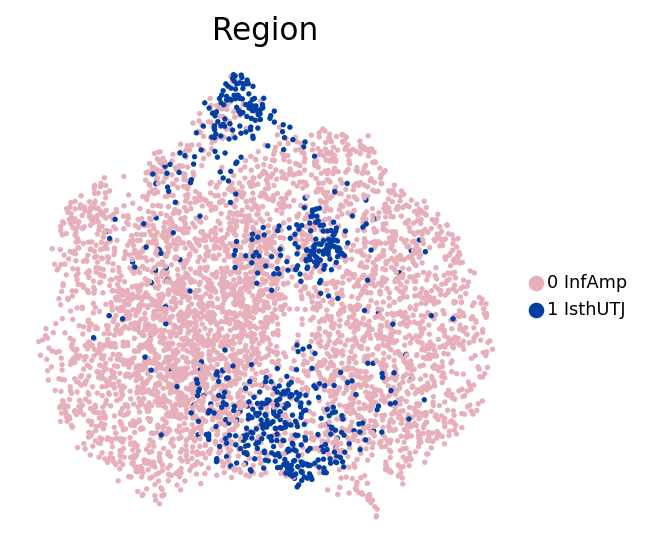

In [35]:
sc.pl.umap(VE2AmIs_subset_batchcorrected, color='Region', legend_loc='right margin', legend_fontsize='8.0',
           frameon=False, save='Veh_E2_2h_3 clusters_Ciliated cells only region.pdf')

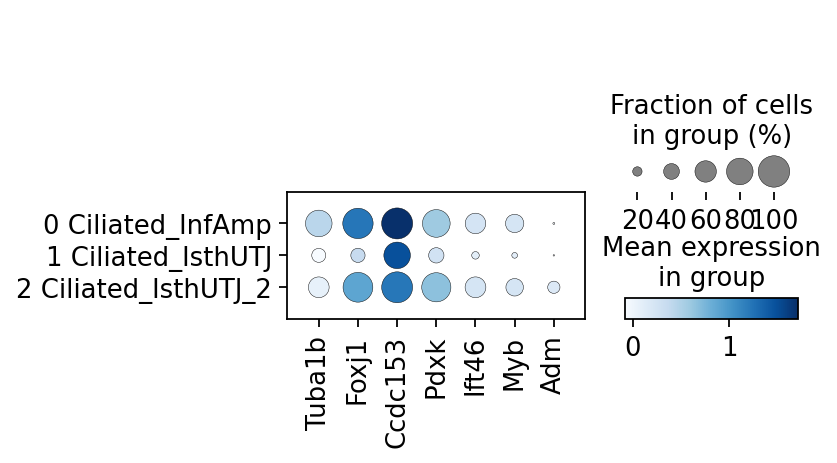

In [36]:
#Ciliogenesis Genes
sc.pl.dotplot(VE2AmIs_subset_batchcorrected, ['Tuba1b', 'Foxj1', 'Ccdc153', 'Pdxk',  
                                                   'Ift46', 'Myb', 'Adm'],
groupby='leiden', color_map='Blues',
             save='Veh_E2_2h_3 clusters__Ciliogenesis genes_leiden_select genes.pdf')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


/opt/conda/envs/winuthayanon-lab/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:408: RuntimeWarning: invalid value encountered in log2
  foldchanges[global_indices]


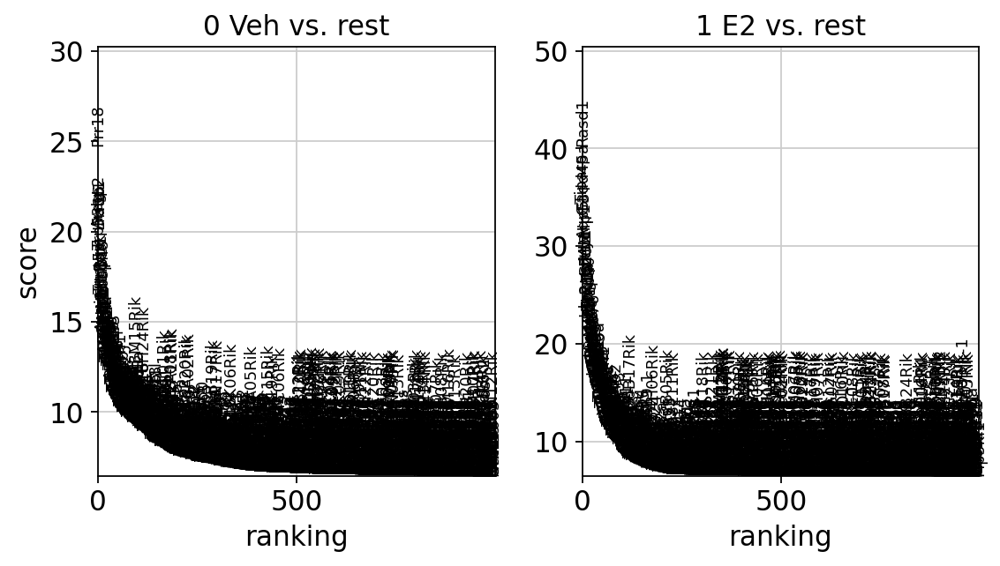

In [37]:
sc.tl.rank_genes_groups(VE2AmIs_subset_batchcorrected, 'Treatment', method='wilcoxon',n_genes=1000)
sc.pl.rank_genes_groups(VE2AmIs_subset_batchcorrected, n_genes=1000, sharey=False)
df = pd.DataFrame(VE2AmIs_subset_batchcorrected.uns['rank_genes_groups']['names']).head(1000)
df.to_csv('./VE2AmIs_subset_3 clusters_Treatment_top1000.csv')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


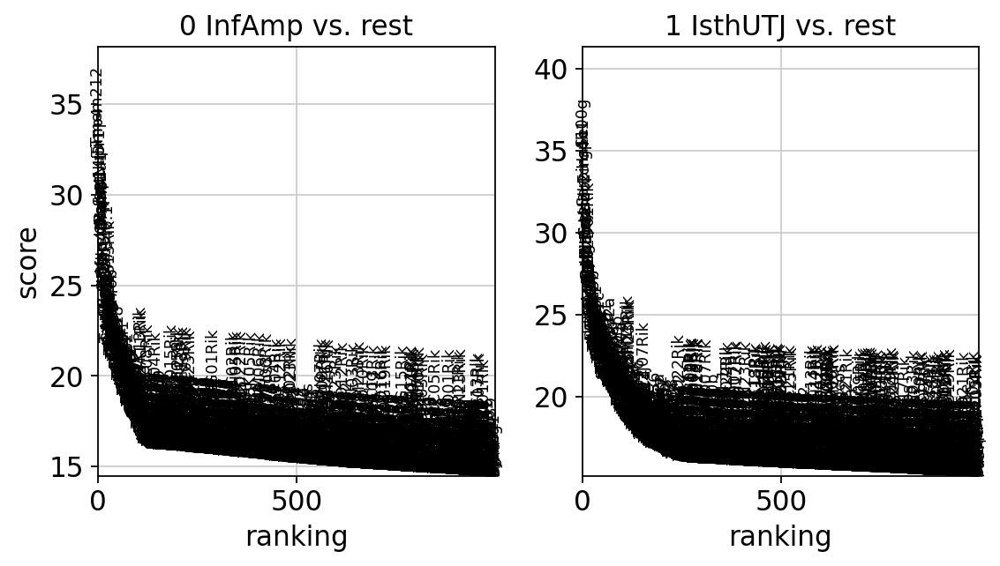

In [38]:
sc.tl.rank_genes_groups(VE2AmIs_subset_batchcorrected, 'Region', method='wilcoxon',n_genes=1000)
sc.pl.rank_genes_groups(VE2AmIs_subset_batchcorrected, n_genes=1000, sharey=False)
df = pd.DataFrame(VE2AmIs_subset_batchcorrected.uns['rank_genes_groups']['names']).head(1000)
df.to_csv('./VE2AmIs_subset_3 clusters_Region_top1000.csv')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:06)


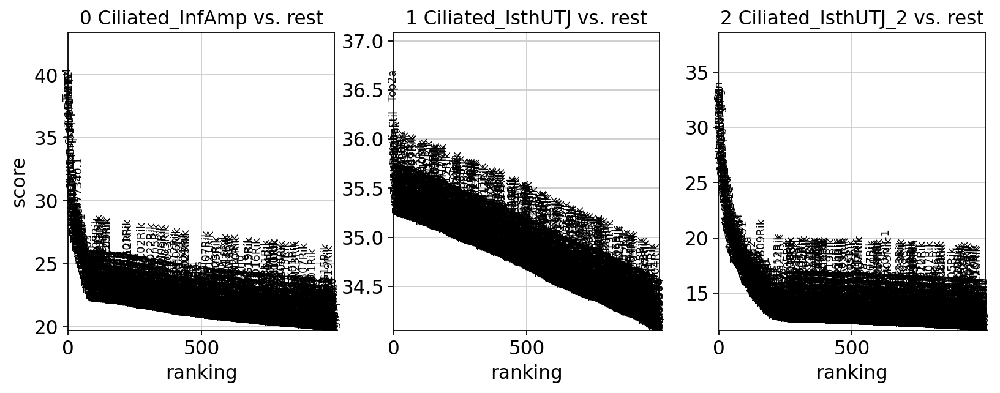

In [39]:
sc.tl.rank_genes_groups(VE2AmIs_subset_batchcorrected, 'leiden', method='wilcoxon',n_genes=1000)
sc.pl.rank_genes_groups(VE2AmIs_subset_batchcorrected, n_genes=1000, sharey=False)
df = pd.DataFrame(VE2AmIs_subset_batchcorrected.uns['rank_genes_groups']['names']).head(1000)
df.to_csv('./VE2AmIs_subset_3 clusters_leiden_top1000.csv')